# Démonstration des données satellite

> **Remarque** : Si vous exécutez ce notebook sur Google Colab et que vous souhaitez enregistrer vos modifications, assurez-vous de cliquer sur ``Fichier`` -> ``Enregistrer une copie dans Drive``. Toutes les modifications seront perdues si vous fermez cet onglet sans enregistrer une copie dans votre Google Drive. Toutes les modifications apportées avant d'enregistrer une copie dans Drive seront enregistrées dans le notebook après avoir enregistré une copie dans Drive. Les données sont téléchargées depuis Internet et stockées sur le disque temporaire de l'environnement. Ces données seront supprimées une fois la session terminée.

Cette démonstration vous montrera quelques concepts clés sur les données satellite et comment elles peuvent être préparées pour la caractérisation. Le notebook vous guidera tout au long du processus de préparation des images, notamment :

1. Chargement des images satellite

1. Inspection des propriétés de l'image

1. Normalisation de l'image

1. Visualisation de l'image

Ce notebook ne couvrira pas le processus de caractérisation. La caractérisation sera abordée dans les chapitres ultérieurs du manuel de formation et dans les blocs-notes de démonstration qui lui sont dédiés.

## Configuration de l'environnement

### Installer les packages requis

Google Colab est un environnement de notebook Jupyter gratuit qui ne nécessite aucune configuration et s'exécute entièrement dans le cloud. Il est livré préinstallé avec de nombreux packages, y compris la plupart de ceux dont nous avons besoin pour ce notebook. Il y a quelques packages supplémentaires que nous devons installer, ce que nous ferons dans la cellule suivante.

https://github.com/spatialthoughts/python-dataviz-web/blob/main/05_xarray_basics.ipynb 

https://github.com/spatialthoughts/python-dataviz-web/blob/main/07_visualizing_rasters.ipynb

In [1]:
%pip install rasterio
%pip install rioxarray
%pip install --upgrade dask

  Using cached affine-2.4.0-py3-none-any.whl.metadata (4.0 kB)
  Using cached cligj-0.7.2-py3-none-any.whl.metadata (5.0 kB)
  Using cached click_plugins-1.1.1-py2.py3-none-any.whl.metadata (6.4 kB)
   ---------------------------------------- 0.0/25.4 MB ? eta -:--:--
   ---------------------------------------- 0.0/25.4 MB ? eta -:--:--
   ---------------------------------------- 0.3/25.4 MB ? eta -:--:--
   -- ------------------------------------- 1.6/25.4 MB 4.7 MB/s eta 0:00:06
   ---- ----------------------------------- 3.1/25.4 MB 6.6 MB/s eta 0:00:04
   ----- ---------------------------------- 3.4/25.4 MB 5.3 MB/s eta 0:00:05
   ----- ---------------------------------- 3.7/25.4 MB 4.2 MB/s eta 0:00:06
   ------ --------------------------------- 3.9/25.4 MB 3.6 MB/s eta 0:00:07
   ------ --------------------------------- 4.2/25.4 MB 3.2 MB/s eta 0:00:07
   ------- -------------------------------- 4.7/25.4 MB 2.9 MB/s eta 0:00:08
   ------- -------------------------------- 5.0/25.4

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-expr 1.1.13 requires dask==2024.8.2, but you have dask 2025.1.0 which is incompatible.
distributed 2024.8.2 requires dask==2024.8.2, but you have dask 2025.1.0 which is incompatible.


### Charger les packages requis

Maintenant que nous avons tous les packages dont nous avons besoin, nous pouvons charger tous ceux que nous utiliserons dans ce notebook.

In [2]:
import os
import requests
from zipfile import ZipFile
import glob
import numpy as np
import pandas as pd
import rasterio.features
import matplotlib.pyplot as plt

from tqdm import tqdm
from rasterio.plot import show
from scipy.signal import convolve2d
from rasterio.warp import calculate_default_transform, Resampling

## Télécharger les images satellite

### Source des données

Cette démonstration utilise les données satellite du programme de données satellite de l'Initiative internationale norvégienne pour le climat et les forêts (NICFI) (https://www.planet.com/nicfi/). Ce programme donne accès aux mosaïques haute résolution et prêtes à l'analyse des tropiques du monde de Planet Labs. Ces données sont mises à disposition gratuitement et les conditions d'utilisation sont fournies dans leur [contrat de licence](https://university.planet.com/nicfi-resources/1219786)

> Vous trouverez plus de détails dans le [Guide de l'utilisateur NICFI](https://assets.planet.com/docs/NICFI_UserGuidesFAQ.pdf)

Ces données ont déjà subi un prétraitement approfondi avant d'être rendues publiques. Cela comprend la normalisation des valeurs de pixels, le masquage des nuages ​​et la génération de cartes de base avec une couverture dans les tropiques (+/- 30 degrés de latitude). 

### Produits de données

L'imagerie NICFI que nous avons téléchargée comprend les mêmes 9 quads de 2 niveaux de traitement différents. Le premier niveau est le niveau « visuel » qui est une simple image RVB. Le deuxième niveau est le niveau « analytique » qui comprend les bandes RVB et NIR. 

Pour vous aider à comprendre les différences entre les deux produits, voici quelques citations du [Guide de l'utilisateur NICFI](https://assets.planet.com/docs/NICFI_UserGuidesFAQ.pdf) :

> **Mosaïques visuelles PlanetScope** : 

> Optimisées pour l'affichage et l'interprétation visuels, les mosaïques visuelles offrent une représentation « en vraies couleurs » de données spatialement précises avec une brume, un éclairage et des effets topographiques minimisés. Elles sont idéales pour les utilisateurs qui surveillent et interprètent visuellement les images satellite.

>

> **Mosaïques de réflectance de surface PlanetScope (prêtes à l'analyse)** : 

> Optimisées pour l'analyse scientifique et quantitative, ces mosaïques offrent une représentation analytique ou « vérité terrain » de données spatialement précises avec des effets minimisés de l'atmosphère et des caractéristiques du capteur. Elles comprennent une quatrième bande (proche infrarouge) et sont adaptées à une variété d'indices de végétation, notamment l'indice de végétation par différence normalisée (NDVI), et plus encore. Elles sont idéales pour les utilisateurs qui surveillent ou interprètent scientifiquement ou quantitativement les images satellite.

L'imagerie visuelle se présente sous la forme d'entiers non signés de 8 bits avec des valeurs allant de 0 à 255. L'imagerie analytique se présente sous la forme d'entiers non signés de 16 bits avec des valeurs allant de 0 à 10 000. 

### Téléchargement des données

Pour faciliter l'utilisation ici, nous avons limité les cartes de base à 9 quads qui forment une grille 3x3 sur Lomé, au Togo. Nous utilisons le même emplacement mais des niveaux de traitement différents pour montrer les différences entre les deux. Les deux ensembles de données proviennent des produits mensuels de décembre 2024.

Ce téléchargement extraira un fichier zip de Zenodo et décompressera ces images dans votre répertoire de données.

In [3]:
# Update when data is available
data_dir = "nicfi_data"

file = "basemaps.zip"
url = f"https://zenodo.org/record/14635861/files/{file}"
local_zip = f"{data_dir}/{file}"
local_dir = local_zip.replace(".zip", "")

os.makedirs(data_dir, exist_ok=True)

if not os.path.exists(local_dir):
    response = requests.get(url)
    with open(local_zip, 'wb') as f:
        f.write(response.content)
    
    with ZipFile(local_zip, 'r') as zip_ref:
        zip_ref.extractall(data_dir)

    os.remove(local_zip)
    
for root, dirs, files in os.walk(data_dir):
    for name in files:
        print(os.path.join(root, name))

nicfi_data\basemaps\.DS_Store
nicfi_data\basemaps\planet_medres_normalized_analytic_2024-12_mosaic\.DS_Store
nicfi_data\basemaps\planet_medres_normalized_analytic_2024-12_mosaic\1031-1060_quad.tif
nicfi_data\basemaps\planet_medres_normalized_analytic_2024-12_mosaic\1031-1061_quad.tif
nicfi_data\basemaps\planet_medres_normalized_analytic_2024-12_mosaic\1031-1062_quad.tif
nicfi_data\basemaps\planet_medres_normalized_analytic_2024-12_mosaic\1032-1060_quad.tif
nicfi_data\basemaps\planet_medres_normalized_analytic_2024-12_mosaic\1032-1061_quad.tif
nicfi_data\basemaps\planet_medres_normalized_analytic_2024-12_mosaic\1032-1062_quad.tif
nicfi_data\basemaps\planet_medres_normalized_analytic_2024-12_mosaic\1033-1060_quad.tif
nicfi_data\basemaps\planet_medres_normalized_analytic_2024-12_mosaic\1033-1061_quad.tif
nicfi_data\basemaps\planet_medres_normalized_analytic_2024-12_mosaic\1033-1062_quad.tif
nicfi_data\basemaps\planet_medres_normalized_visual_2024-12_mosaic\1031-1060_quad.tif
nicfi_data\ba

## Charger une image satellite

### Lister les images

Maintenant que nous avons les images satellite dans notre répertoire de données, chargeons et inspectons une image au hasard. Nous définissons une graine aléatoire pour la reproductibilité. Vous pouvez manipuler la valeur `seed` pour obtenir une nouvelle image, ou vous pouvez choisir dans `image_list` pour charger une image spécifique.

La première chose que nous allons faire est de définir le répertoire avec les images et de lister les images dans ce répertoire. Nous allons ensuite charger une image aléatoire dans la liste et inspecter ses propriétés.

Nous allons ensuite démontrer plusieurs manières courantes d'ouvrir et d'inspecter les propriétés de l'image et les valeurs des pixels.

In [4]:
seed = 456
np.random.seed(seed)

mosaic = "planet_medres_normalized_visual_2024-12_mosaic"

image_dir = os.path.join(local_dir, mosaic)

image = str(np.random.choice(os.listdir(image_dir)))

image_path = os.path.join(image_dir, image)

image_path

'nicfi_data/basemaps\\planet_medres_normalized_visual_2024-12_mosaic\\1032-1062_quad.tif'

### Charger l'image avec `rasterio`

Rasterio est une bibliothèque Python conçue pour la lecture et l'écriture de données raster géospatiales. Elle fournit une interface simple pour travailler avec des formats raster en utilisant GDAL sous le capot. Rasterio est particulièrement bien adapté aux flux de travail qui impliquent l'accès, l'inspection et la manipulation de fichiers raster individuels, tels que le géoréférencement ou le découpage dans des limites spécifiques. Sa nature légère et son accent sur les opérations basées sur les fichiers en font un excellent choix pour les utilisateurs qui ont besoin d'un contrôle précis sur le traitement des données raster, en particulier pour les ensembles de données de petite à moyenne taille.

In [5]:
import rasterio

with rasterio.open(image_path) as src:
    rast = src.read([1, 2, 3])

print(f"""
Shape: {rast.shape}
CRS: {src.crs}
Driver: {src.driver}
Data type: {src.dtypes[0]}
Dataset name: {src.name}
Bounds: {src.bounds}
Data sample: 
{rast[:1]}
""")


Shape: (3, 4096, 4096)
CRS: EPSG:3857
Driver: GTiff
Data type: uint8
Dataset name: nicfi_data/basemaps\planet_medres_normalized_visual_2024-12_mosaic\1032-1062_quad.tif
Bounds: BoundingBox(left=156543.0339125581, bottom=743579.4110611767, right=176110.91315084547, top=763147.290299464)
Data sample: 
[[[77 73 68 ... 50 48 54]
  [68 67 64 ... 48 49 56]
  [63 63 61 ... 54 55 59]
  ...
  [46 40 36 ... 79 79 75]
  [42 39 37 ... 69 68 67]
  [42 41 39 ... 63 61 59]]]



### Charger l'image avec `xarray`

Xarray est une bibliothèque polyvalente conçue pour gérer des ensembles de données étiquetés multidimensionnels. Bien qu'elle ne soit pas spécifique aux données géospatiales, elle excelle dans le travail avec des ensembles de données comportant plusieurs dimensions, telles que le temps, la latitude et la longitude. La principale force de Xarray réside dans sa capacité à gérer efficacement de grands ensembles de données avec un chargement différé et un traitement parallèle, en particulier lorsqu'il est combiné avec Dask. Il est idéal pour les utilisateurs travaillant avec des ensembles de données spatiotemporels complexes ou des ensembles de données nécessitant des opérations mathématiques avancées et des agrégations entre dimensions. 

Nous n'allons pas examiner une grande partie des métadonnées avec `xarray` car l'interface est la même que `rioxarray` et nous l'utiliserons à la place. En général, les commandes seront similaires.

In [6]:
import xarray as xr

xrds = xr.open_dataset(image_path)
xrds

<xarray.Dataset> Size: 269MB
Dimensions:      (band: 4, x: 4096, y: 4096)
Coordinates:
  * band         (band) int32 16B 1 2 3 4
  * x            (x) float64 33kB 1.565e+05 1.566e+05 ... 1.761e+05 1.761e+05
  * y            (y) float64 33kB 7.631e+05 7.631e+05 ... 7.436e+05 7.436e+05
    spatial_ref  int32 4B ...
Data variables:
    band_data    (band, y, x) float32 268MB ...

### Charger l'image avec `rioxarray`

Rioxarray s'appuie sur `Xarray`, ajoutant des capacités géospatiales à sa puissante gestion des données. Il intègre la fonctionnalité géospatiale de `Rasterio` avec les structures de données multidimensionnelles de `Xarray`, ce qui en fait un outil complet pour l'analyse raster géospatiale. `Rioxarray` est parfait pour les utilisateurs qui ont besoin de travailler avec des données raster géospatiales tout en exploitant les capacités de `Xarray` pour une analyse avancée et une évolutivité. C'est un excellent choix pour combiner des opérations géospatiales avec des flux de travail de données multidimensionnels, en particulier pour l'analyse à grande échelle.

Dans le code ci-dessous, nous utilisons cette bibliothèque pour ouvrir l'image et inspecter ses propriétés.

In [7]:
import rioxarray

rxrds = rioxarray.open_rasterio(image_path)
rxrds

<xarray.DataArray (band: 4, y: 4096, x: 4096)> Size: 67MB
[67108864 values with dtype=uint8]
Coordinates:
  * band         (band) int32 16B 1 2 3 4
  * x            (x) float64 33kB 1.565e+05 1.566e+05 ... 1.761e+05 1.761e+05
  * y            (y) float64 33kB 7.631e+05 7.631e+05 ... 7.436e+05 7.436e+05
    spatial_ref  int32 4B 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0

Nous pouvons voir que l'image comporte 4 bandes, chacune de 238x234 pixels. L'image ne contient aucune autre information spatiale, telle qu'un système de référence de coordonnées ou une transformation. Cela est dû au fait que l'image a été découpée à partir de quads de carte de base plus grands (qui contenaient de telles informations) et pour économiser de l'espace, nous avons coupé la 5e bande et les informations spatiales. 

Au lieu de cela, nous nous appuyons sur le nom du fichier qui possède un identifiant d'emplacement de grille unique. Cet identifiant contient la latitude et la longitude. Cette latitude/longitude est le centre de la cellule de la grille et donc le centre de l'image. Si vous avez accès à plus de stockage et de mémoire, il serait préférable de mettre à jour la puce d'image avec les informations spatiales de la carte de base d'origine.

Nous pouvons accéder aux valeurs de pixels de l'image à l'aide de l'attribut `data`. Cela renvoie un tableau `numpy` avec les valeurs de pixels. Pour limiter ce qui est renvoyé pour inspection, nous allons sous-ensemble le tableau de données avec `[:1]`

In [8]:
rxrds.data[:1]

array([[[ 99, 111, 115, ...,  43,  48,  41],
        [105, 111, 115, ...,  48,  51,  47],
        [113, 113, 107, ...,  50,  49,  49],
        ...,
        [ 54,  56,  53, ...,  48,  50,  54],
        [ 54,  57,  54, ...,  45,  48,  53],
        [ 54,  54,  52, ...,  45,  50,  50]]], dtype=uint8)

Nous pouvons également accéder aux valeurs de pixels d'une bande spécifique en utilisant la méthode `sel`. Cette méthode nous permet de sélectionner une bande spécifique en utilisant le nom ou l'index de la bande. Dans ce cas, nous sélectionnons la bande rouge en utilisant le nom de la bande.

In [9]:
rxrds.sel(band=1)

<xarray.DataArray (y: 4096, x: 4096)> Size: 17MB
array([[ 99, 111, 115, ...,  43,  48,  41],
       [105, 111, 115, ...,  48,  51,  47],
       [113, 113, 107, ...,  50,  49,  49],
       ...,
       [ 54,  56,  53, ...,  48,  50,  54],
       [ 54,  57,  54, ...,  45,  48,  53],
       [ 54,  54,  52, ...,  45,  50,  50]], dtype=uint8)
Coordinates:
    band         int64 8B 1
  * x            (x) float64 33kB 1.761e+05 1.761e+05 ... 1.957e+05 1.957e+05
  * y            (y) float64 33kB 7.24e+05 7.24e+05 ... 7.045e+05 7.044e+05
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0

Vous pouvez inspecter le système de référence de coordonnées (CRS) avec `rio.crs` ou en accédant à l'attribut `spatial_ref`. Dans ce cas, l'imagerie utilise le CRS « WGS 84 / Pseudo-Mercator » `EPSG:3857`. Ces informations sont stockées dans un format appelé « Well-Known Text » (WKT).

In [10]:
rxrds.rio.crs

CRS.from_wkt('PROJCS["WGS 84 / Pseudo-Mercator",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Mercator_1SP"],PARAMETER["central_meridian",0],PARAMETER["scale_factor",1],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],EXTENSION["PROJ4","+proj=merc +a=6378137 +b=6378137 +lat_ts=0 +lon_0=0 +x_0=0 +y_0=0 +k=1 +units=m +nadgrids=@null +wktext +no_defs"],AUTHORITY["EPSG","3857"]]')

In [11]:
rxrds.spatial_ref

<xarray.DataArray 'spatial_ref' ()> Size: 8B
array(0)
Coordinates:
    spatial_ref  int64 8B 0
Attributes:
    crs_wkt:       PROJCS["WGS 84 / Pseudo-Mercator",GEOGCS["WGS 84",DATUM["W...
    spatial_ref:   PROJCS["WGS 84 / Pseudo-Mercator",GEOGCS["WGS 84",DATUM["W...
    GeoTransform:  176110.91315084323 4.77731426716 0.0 724011.53182289 0.0 -...

### Pourquoi choisir l'un plutôt que l'autre ?

- Utilisez « Rasterio » pour des opérations simples au niveau des fichiers et lorsque vous avez besoin d'un contrôle direct sur la manipulation des données géospatiales.

- Choisissez « Xarray » pour travailler avec des données multidimensionnelles sans métadonnées géospatiales ou lorsque vous effectuez des opérations mathématiques complexes sur plusieurs dimensions. Il est également idéal pour travailler avec d'autres formats de fichiers comme NetCDF.

- Optez pour « Rioxarray » lorsque vous avez besoin d'un mélange de gestion des métadonnées géospatiales et d'analyse multidimensionnelle, en particulier pour les flux de travail évolutifs avec de grands ensembles de données. Il a des fonctionnalités similaires à « xarray » mais peut être mieux adapté aux données raster.

## Visualiser le produit de données « visuel »

### Présentation

L'imagerie NICFI est disponible en deux niveaux de traitement : visuel et analytique. Nous allons d'abord examiner le produit de données visuel. Il s'agit d'une image RVB simple optimisée pour l'affichage et l'interprétation visuels. Elle offre une représentation en « couleurs vraies » de données spatialement précises avec une brume, un éclairage et des effets topographiques minimisés. Elle est idéale pour les utilisateurs qui surveillent et interprètent visuellement les images satellite. Il s'agit du type d'imagerie qui a été utilisé pour l'API MOSAIKS. Le produit de données exact est légèrement différent, car l'API s'appuyait sur la carte de base Planet Labs plutôt que sur la carte de base NICFI. La principale différence est que la carte de base NICFI subit une normalisation d'image plus spécialisée qui vise à optimiser l'imagerie pour la surveillance de la déforestation.

### Les trois bandes d'imagerie visuelle

Pour nos visualisations et manipulations de base, nous utiliserons `rasterio`. La première chose que nous examinerons est chacune des trois bandes visuelles. Nous allons tracer chaque bande individuellement ainsi que le composite RVB. Cela nous permettra d'avoir une idée de la forme de l'image, des structures qu'elle représente et de l'échelle des valeurs de couleur. Dans ce cas, nous nous attendons à ce que nos valeurs de pixels soient comprises entre 0 et 255. Cette plage est courante pour les entiers non signés de 8 bits, qui sont le format de l'imagerie visuelle. L'axe du tracé affichera le nombre de pixels dans la direction x et y, plutôt que l'emplacement des pixels dans l'espace. Dans certaines applications, vous souhaiterez tracer l'image dans son contexte spatial.

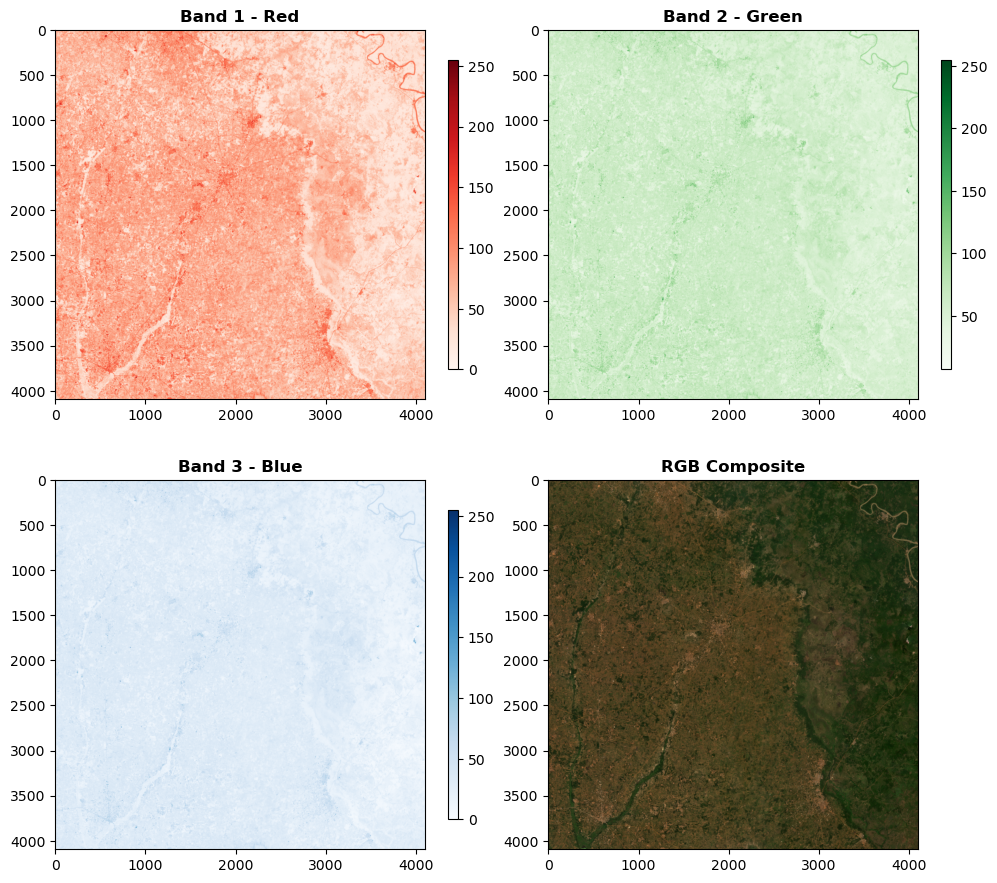

In [12]:
# Open the image file
with rasterio.open(image_path) as src:
    # Read all four bands
    band1 = src.read(1)  # Red
    band2 = src.read(2)  # Green
    band3 = src.read(3)  # Blue
    rgb_image = np.stack([band1, band2, band3], axis=-1)

    # you can also read the image as a single array
    # img = src.read([1, 2, 3])

    # Adjust figure size and spacing
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 9))
    plt.subplots_adjust(wspace=0.0, hspace=0.0)  # Adjust spacing between subplots

    im1 = show(band1, ax=ax1, title="Band 1 - Red", cmap="Reds")
    plt.colorbar(im1.get_images()[0], ax=ax1, shrink=0.7, aspect=30)

    im2 = show(band2, ax=ax2, title="Band 2 - Green", cmap="Greens")
    plt.colorbar(im2.get_images()[0], ax=ax2, shrink=0.7, aspect=30)

    im3 = show(band3, ax=ax3, title="Band 3 - Blue", cmap="Blues")
    plt.colorbar(im3.get_images()[0], ax=ax3, shrink=0.7, aspect=30)

    im4 = ax4.imshow(rgb_image)
    ax4.set_title(f"RGB Composite", fontweight="bold")
    ax4.axis("on")
    # Add invisible colorbar
    cbar = plt.colorbar(im4, ax=ax4, shrink=0.8, aspect=30)
    cbar.ax.set_visible(False)

    # Adjust layout with specified padding
    plt.tight_layout(pad=0.0)
    plt.show()

Maintenant que nous avons vu de nombreuses propriétés de l'image, examinons l'image avec des axes qui nous sont plus familiers. Cette fois, nous reprojetons l'image sur « EPSG:4326 », qui est le système de référence de coordonnées WGS 84. Cela nous permettra de tracer l'image dans son contexte spatial et dans un format qui nous est plus familier.

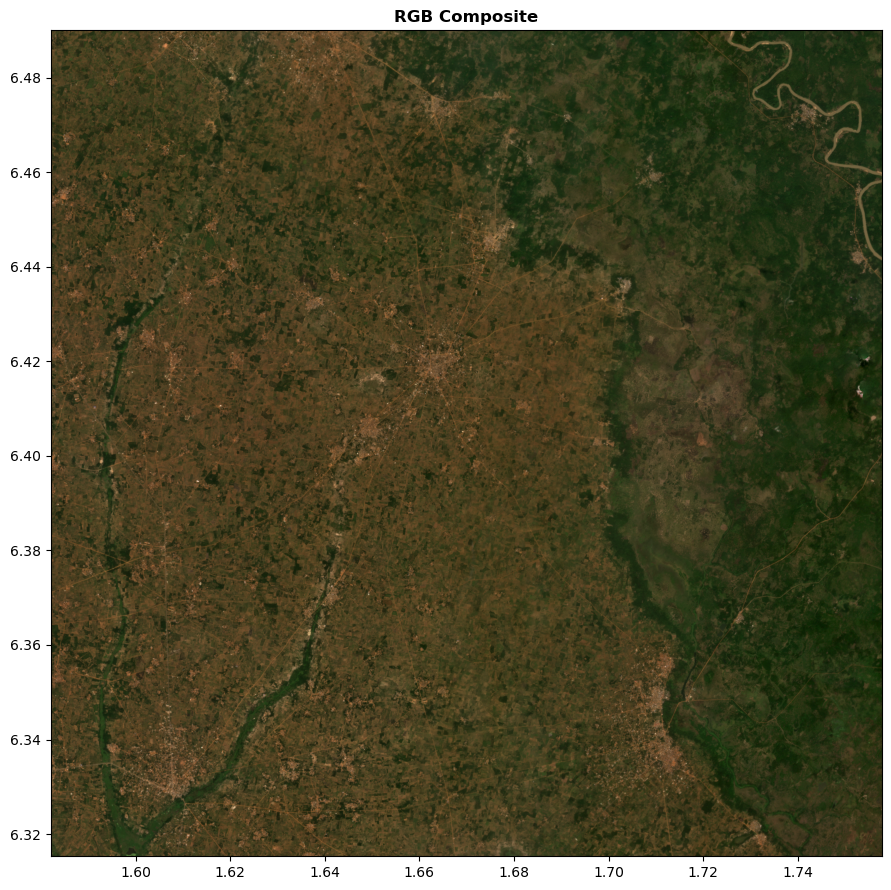

In [13]:
# Open the original image file
with rasterio.open(image_path) as src:
    # Define the target CRS
    target_crs = "EPSG:4326"

    # Calculate transform and dimensions for the target CRS
    transform, width, height = calculate_default_transform(
        src.crs, target_crs, src.width, src.height, *src.bounds
    )

    # Read bands 1, 2, and 3 in one go, reprojecting to new dimensions
    data = src.read(
        indexes=[1, 2, 3], out_shape=(3, height, width), resampling=Resampling.nearest
    )

    # Calculate the spatial extent
    extent = (
        transform[2],  # left
        transform[2] + width * transform[0],  # right
        transform[5] + height * transform[4],  # bottom
        transform[5],  # top
    )

# Create an RGB array from the three-band data
rgb_image = np.transpose(data, (1, 2, 0))  # shape: (height, width, 3)

# Plot only the RGB composite with no colorbar
plt.figure(figsize=(10, 9))
plt.imshow(rgb_image, extent=extent)
plt.title("RGB Composite", fontweight="bold")
# plt.axis("off")
plt.tight_layout()
plt.show()


## Visualisez le produit de données « analytiques »

### Présentation

L'imagerie analytique NICFI contient quatre bandes spectrales : rouge, vert, bleu et proche infrarouge (NIR). Ces bandes sont mieux adaptées à l'analyse scientifique et quantitative que l'imagerie visuelle, car elles fournissent plus d'informations sur la réflectance de surface de la Terre. Nous allons ici examiner la même scène que l'imagerie visuelle, mais cette fois en utilisant l'imagerie analytique. Cela nous permettra de comparer les deux produits, de voir comment les valeurs des pixels diffèrent et de comprendre les informations supplémentaires fournies par la bande NIR.

**Remarque :** Bien que nous visualisions l'imagerie analytique dans cette section, elle n'est pas destinée à être utilisée pour les visualisations. Il est recommandé d'utiliser l'imagerie visuelle pour les visualisations, car elle est optimisée à cette fin. 

### Les quatre bandes de l'imagerie analytique

Pour nos quatre visualisations et manipulations de base, nous utiliserons « rasterio ». La première chose que nous examinerons est chacune des quatre bandes pour avoir une idée de la forme de l’image, des structures qu’elle représente et de l’échelle des valeurs de couleur.

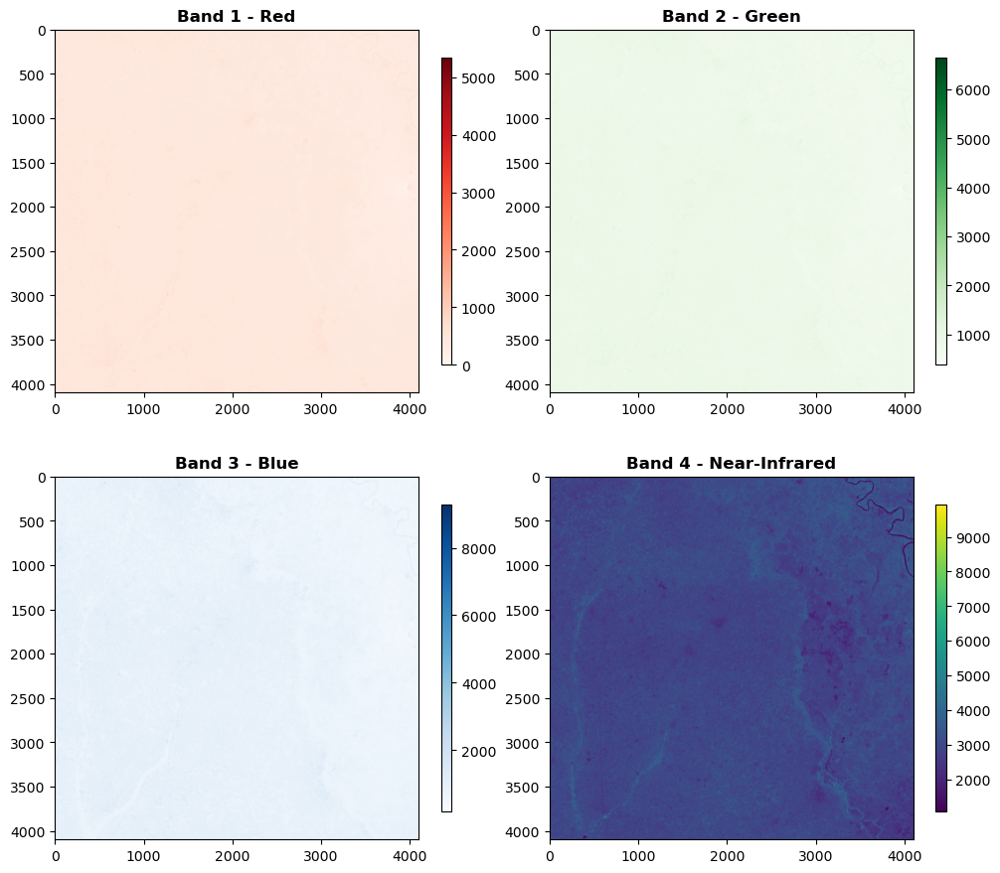

In [14]:
mosaic = "planet_medres_normalized_analytic_2024-12_mosaic"

image_dir = os.path.join(local_dir, mosaic)

image_path = os.path.join(image_dir, image)

# Open the image file
with rasterio.open(image_path) as src:
    # Read all four bands
    band1 = src.read(1)  # Red
    band2 = src.read(2)  # Green
    band3 = src.read(3)  # Blue
    band4 = src.read(4)  # NIR

    # Adjust figure size and spacing
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 9))
    plt.subplots_adjust(wspace=0.0, hspace=0.0)  # Adjust spacing between subplots

    im1 = show(band1, ax=ax1, title="Band 1 - Red", cmap="Reds")
    plt.colorbar(im1.get_images()[0], ax=ax1, shrink=0.7, aspect=30)

    im2 = show(band2, ax=ax2, title="Band 2 - Green", cmap="Greens")
    plt.colorbar(im2.get_images()[0], ax=ax2, shrink=0.7, aspect=30)

    im3 = show(band3, ax=ax3, title="Band 3 - Blue", cmap="Blues")
    plt.colorbar(im3.get_images()[0], ax=ax3, shrink=0.7, aspect=30)

    im4 = show(band4, ax=ax4, title="Band 4 - Near-Infrared", cmap="viridis")
    plt.colorbar(im4.get_images()[0], ax=ax4, shrink=0.7, aspect=30)

    # Adjust layout with specified padding
    plt.tight_layout(pad=0.0)
    plt.show()

Eh bien, il n'y a pas grand-chose à voir dans l'image ci-dessus. La seule bande contenant des informations nous indiquant qu'il s'agit du même emplacement que l'imagerie visuelle est la bande NIR qui met en évidence la rivière dans le coin supérieur droit. Les autres bandes ont toutes des valeurs extrêmes qui rendent la visualisation difficile. 

Pour surmonter ce problème, nous allons limiter les valeurs à celles comprises entre le 1er et le 99e percentile. Cela supprimera les valeurs extrêmes et nous permettra de voir l'image plus clairement.

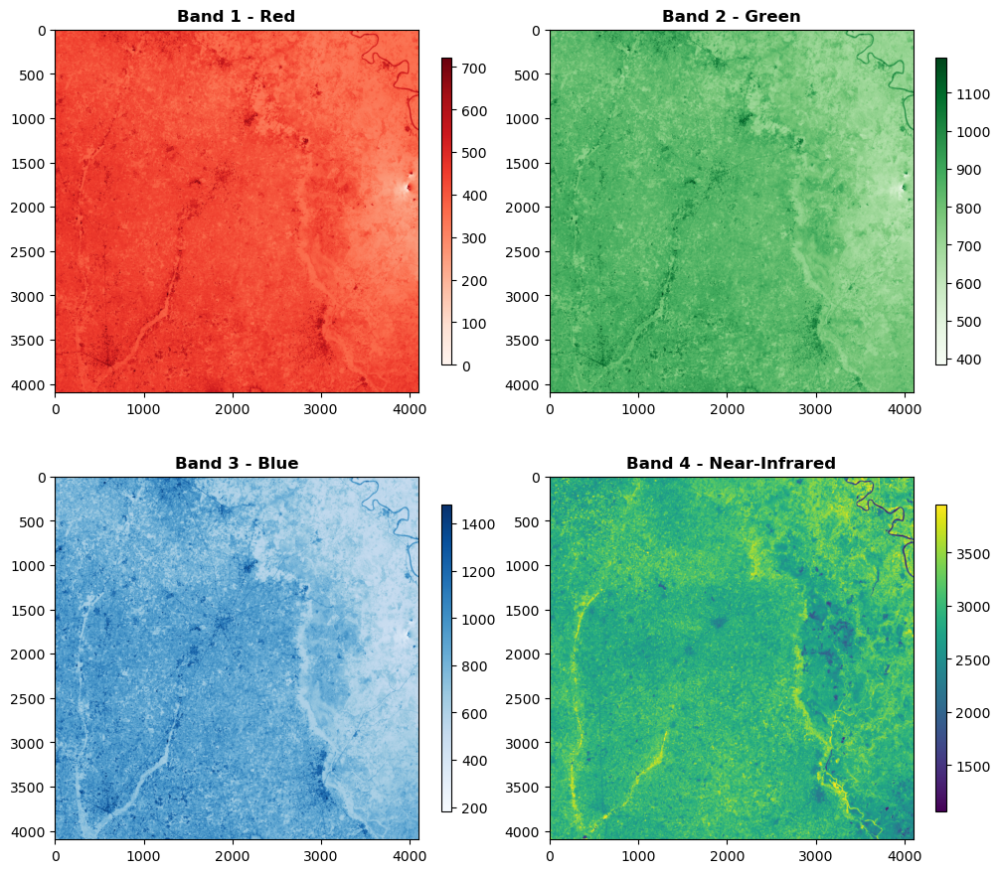

In [15]:
with rasterio.open(image_path) as src:
    # Read first 4 bands
    bands_data = [src.read(i + 1) for i in range(4)]

# Define titles and color maps
titles = ["Band 1 - Red", "Band 2 - Green", "Band 3 - Blue", "Band 4 - Near-Infrared"]
cmaps = ["Reds", "Greens", "Blues", "viridis"]

# Calculate percentiles for each band
percentiles = [np.percentile(band, [0.0, 99.9]) for band in bands_data]

# Set up 2x2 plot
fig, axes = plt.subplots(2, 2, figsize=(10, 9))
axes = axes.ravel()
plt.subplots_adjust(wspace=0.0, hspace=0.0)

# Display each band
for ax, band, (p1, p99), cmap, title in zip(
    axes, bands_data, percentiles, cmaps, titles
):
    im = show(band, ax=ax, cmap=cmap, vmin=p1, vmax=p99, title=title)
    plt.colorbar(im.get_images()[0], ax=ax, shrink=0.7, aspect=30)

plt.tight_layout(pad=0.0)
plt.show()


#### Normalisation de l'image

Dans la section ci-dessus, nous voyons que les valeurs de pixels de l'image sont comprises entre 0 et 10 000. Il s'agit d'une plage courante pour l'imagerie satellite, car elle permet de capturer une large gamme de valeurs. Cependant, ces valeurs peuvent devoir être transformées avant de pouvoir être visualisées ou utilisées dans des modèles d'apprentissage automatique.

> Recommandation de lecture : [Revisiter les repères des modèles de télédétection pré-entraînés : le redimensionnement et la normalisation sont importants](https://arxiv.org/abs/2305.13456)

Dans cette section, nous examinerons la même image, mais cette fois-ci, nous normaliserons les valeurs de pixels pour qu'elles soient comprises entre 0 et 1. Il s'agit d'une étape de prétraitement courante lorsque l'on travaille avec des images, car elle peut aider à améliorer les performances et la vitesse des modèles d'apprentissage automatique. 

Dans ce premier passage, nous adoptons une méthode simpliste de normalisation des valeurs de pixels. Il existe de nombreuses façons de réaliser la normalisation d'image, et nous avons vu que ce que vous choisissez peut avoir un impact en aval sur les performances de votre modèle MOSAIKS final.

Dans ce cas, nous normalisons les valeurs de pixels pour chaque bande indépendamment, en utilisant les valeurs de pixels minimales et maximales pour chaque bande. Le calcul est le suivant : 

$$normalized = \frac{pixel - min}{max - min}$$

Où min est la valeur de pixel minimale dans la bande et max est la valeur de pixel maximale dans la bande. Le nouveau tableau « normalized » aura des valeurs de pixels comprises entre 0 et 1. Nous répétons cette opération pour chaque bande de l'image.

Il existe de nombreuses méthodes courantes pour normaliser les images, et la meilleure méthode dépendra du cas d'utilisation spécifique. Par exemple, vous souhaiterez peut-être normaliser les valeurs de pixels pour avoir une moyenne de 0 et un écart type de 1. Dans ce cas, vous utiliseriez le calcul suivant :

$$normalized = \frac{pixel - mean}{std}$$

Où mean est la valeur moyenne des pixels dans la bande et std est l'écart type des valeurs de pixels dans la bande.

Vous pouvez également normaliser les valeurs de pixels sur toutes les bandes, plutôt qu'indépendamment pour chaque bande. Cela peut être utile si vous souhaitez comparer les valeurs de pixels sur plusieurs bandes (c'est-à-dire si vous vous attendez à ce que votre résultat soit influencé par les valeurs relatives des bandes, plutôt que par les valeurs absolues).

Enfin, il est courant de dessiner les valeurs minimales, maximales ou moyennes pour chaque bande sur toutes les images de votre ensemble de données. Cela peut vous aider à comprendre la plage de valeurs de pixels dans votre ensemble de données et à identifier les valeurs aberrantes ou les anomalies. En raison des valeurs extrêmes, il peut être judicieux d'utiliser une normalisation basée sur le centile, où vous normalisez les valeurs de pixels pour qu'elles soient comprises entre le 1er et le 99e centile des valeurs de pixels de la bande.

#### Visualisez l'image normalisée

Ceci n'est qu'un point de départ pour la normalisation des images, et vous devrez peut-être expérimenter différentes méthodes pour trouver celle qui convient le mieux à votre cas d'utilisation spécifique. Pour l'instant, utilisons la méthode simple de normalisation des valeurs de pixels pour qu'elles soient comprises entre 0 et 1.

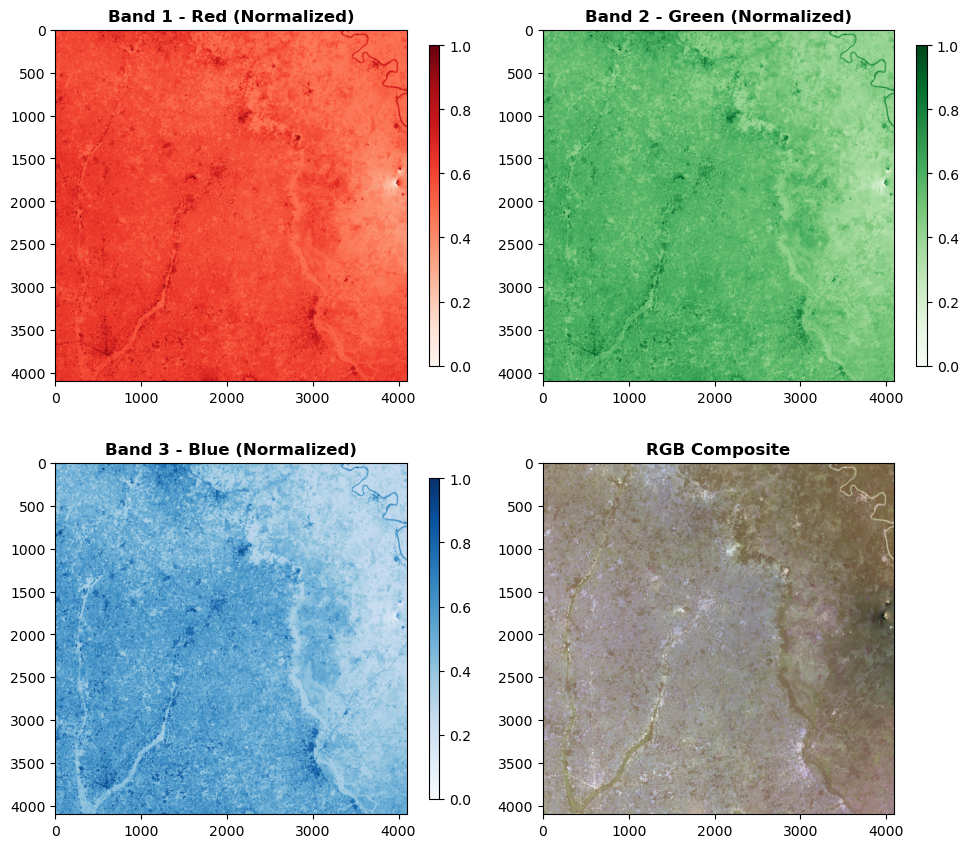

In [17]:
# Open the image file
with rasterio.open(image_path) as src:
    # Read and normalize each band independently
    band1 = src.read(1)  # Red
    band2 = src.read(2)  # Green
    band3 = src.read(3)  # Blue

    # Normalize each band independently
    # Compute percentiles for each of the RGB bands
    p0_band1, p99_band1 = np.percentile(band1, [0, 99.9])
    p0_band2, p99_band2 = np.percentile(band2, [0, 99.9])
    p0_band3, p99_band3 = np.percentile(band3, [0, 99.9])

    # Scale each band to [0,1] range using the 1–99 percentile stretch
    r_scaled = np.clip((band1 - p0_band1) / (p99_band1 - p0_band1), 0, 1)
    g_scaled = np.clip((band2 - p0_band2) / (p99_band2 - p0_band2), 0, 1)
    b_scaled = np.clip((band3 - p0_band3) / (p99_band3 - p0_band3), 0, 1)

    # Create RGB composite from normalized bands
    rgb = np.dstack((r_scaled, g_scaled, b_scaled))

    # Create the figure
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 8.8))
    plt.subplots_adjust(wspace=0.3, hspace=0.3)

    # Plot individual bands using normalized data
    im1 = show(r_scaled, ax=ax1, title="Band 1 - Red (Normalized)", cmap="Reds")
    plt.colorbar(im1.get_images()[0], ax=ax1, shrink=0.8, aspect=30)

    im2 = show(g_scaled, ax=ax2, title="Band 2 - Green (Normalized)", cmap="Greens")
    plt.colorbar(im2.get_images()[0], ax=ax2, shrink=0.8, aspect=30)

    im3 = show(b_scaled, ax=ax3, title="Band 3 - Blue (Normalized)", cmap="Blues")
    plt.colorbar(im3.get_images()[0], ax=ax3, shrink=0.8, aspect=30)

    # Plot gamma-corrected RGB composite
    im4 = ax4.imshow(rgb)
    ax4.set_title("RGB Composite", fontweight="bold")
    ax4.axis("on")
    # Add invisible colorbar
    cbar = plt.colorbar(im4, ax=ax4, shrink=0.8, aspect=30)
    cbar.ax.set_visible(False)

    plt.tight_layout(pad=1.0)
    plt.show()


Enfin, nous pouvons comparer l'image normalisée à l'image d'origine. Nous allons tracer les deux versions côte à côte. Cela devrait illustrer à quel point il peut être difficile de visualiser l'imagerie analytique. En général, l'imagerie visuelle est mieux adaptée aux visualisations, tandis que l'imagerie analytique est mieux adaptée à l'analyse scientifique et quantitative. 

Dans cette étape, nous ajoutons une étape supplémentaire, la correction gamma à l'imagerie analytique. Il s'agit d'une technique courante utilisée pour améliorer le contraste d'une image et qui peut aider à faire ressortir des détails difficiles à voir dans l'image d'origine. Dans ce cas, elle nous rapproche de l'aspect de l'imagerie visuelle.

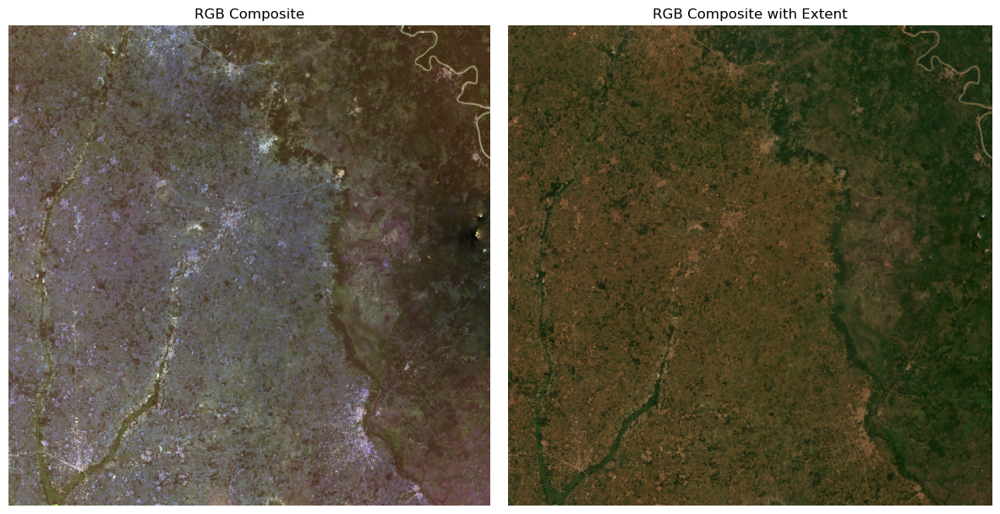

In [18]:
with rasterio.open(image_path) as src:
    # Read the Red, Green, Blue, and NIR bands
    band1 = src.read(1)  # Red
    band2 = src.read(2)  # Green
    band3 = src.read(3)  # Blue

# Compute percentiles for each of the RGB bands
p1_band1, p99_band1 = np.percentile(band1, [0, 99.9])
p1_band2, p99_band2 = np.percentile(band2, [0, 99.9])
p1_band3, p99_band3 = np.percentile(band3, [0, 99.9])

# Scale each band to [0,1] range using the 1–99 percentile stretch
r_scaled = np.clip((band1 - p1_band1) / (p99_band1 - p1_band1), 0, 1)
g_scaled = np.clip((band2 - p1_band2) / (p99_band2 - p1_band2), 0, 1)
b_scaled = np.clip((band3 - p1_band3) / (p99_band3 - p1_band3), 0, 1)

rgb_composite = np.stack([r_scaled, g_scaled, b_scaled], axis=-1)

# Optional gamma correction
gamma = 1.8
rgb_composite = rgb_composite**gamma

# Plot them side by side in a single figure
plt.figure(figsize=(12, 6))

# First subplot
plt.subplot(1, 2, 1)
plt.imshow(rgb_composite)
plt.axis("off")
plt.title("RGB Composite")

# Second subplot
plt.subplot(1, 2, 2)
plt.imshow(rgb_image, extent=extent)
plt.axis("off")
plt.title("RGB Composite with Extent")

plt.tight_layout()
plt.show()

#### Autres méthodes de normalisation

Z-score, max, percentile. Espace réservé

In [19]:
#### Placeholder

### Améliorer la netteté de l'image

Nous pouvons voir que l'image est un peu floue. C'est courant dans l'imagerie satellite, car les images sont souvent prises à distance et peuvent être affectées par les conditions atmosphériques. Une façon d'améliorer la netteté de l'image est d'appliquer un filtre de netteté. Il s'agit d'une technique courante dans le traitement d'images, qui peut aider à faire ressortir les détails de l'image.

Nous allons appliquer un filtre de netteté à l'image, puis nous visualiserons l'image d'entrée, l'image nette et la différence entre les deux sous forme de carte et d'histogramme.

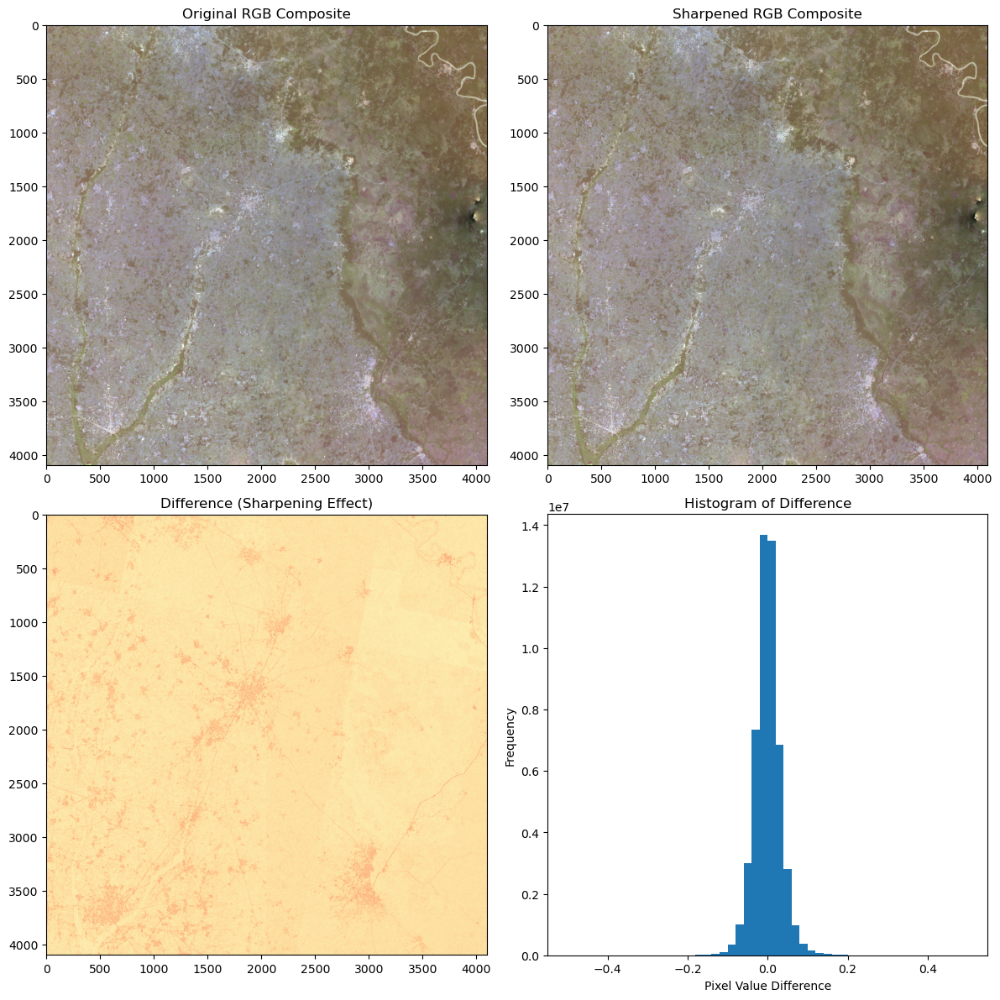

In [20]:
def sharpen_image(image):
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    # Apply kernel to each band
    if len(image.shape) == 3:
        sharpened = np.zeros_like(image)
        for i in range(image.shape[2]):
            sharpened[:, :, i] = convolve2d(
                image[:, :, i], kernel, mode="same", boundary="symm"
            )
    else:
        sharpened = convolve2d(image, kernel, mode="same", boundary="symm")

    return np.clip(sharpened, 0, 1)


with rasterio.open(image_path) as src:
    # Read each band
    band1 = src.read(1)  # Red
    band2 = src.read(2)  # Green
    band3 = src.read(3)  # Blue

    # Compute percentiles for each of the RGB bands
    p1_band1, p99_band1 = np.percentile(band1, [0, 99.9])
    p1_band2, p99_band2 = np.percentile(band2, [0, 99.9])
    p1_band3, p99_band3 = np.percentile(band3, [0, 99.9])

    # Scale each band to [0,1] range using the 1–99 percentile stretch
    r_scaled = np.clip((band1 - p1_band1) / (p99_band1 - p1_band1), 0, 1)
    g_scaled = np.clip((band2 - p1_band2) / (p99_band2 - p1_band2), 0, 1)
    b_scaled = np.clip((band3 - p1_band3) / (p99_band3 - p1_band3), 0, 1)

    rgb = np.stack([r_scaled, g_scaled, b_scaled], axis=-1)

    # Create sharpened version
    rgb_sharpened = sharpen_image(rgb)

    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))
    plt.subplots_adjust(wspace=0.3, hspace=0.3)

    # Plot original RGB composite
    ax1.imshow(rgb)
    ax1.set_title("Original RGB Composite")
    ax1.axis("on")

    # Plot sharpened RGB composite
    ax2.imshow(rgb_sharpened)
    ax2.set_title("Sharpened RGB Composite")
    ax2.axis("on")

    # Plot difference between original and sharpened
    difference = rgb_sharpened - rgb

    rms_difference = np.sqrt(np.mean(difference**2, axis=2))
    ax3.imshow(rms_difference, cmap="magma")

    magnitude_difference = np.sqrt(np.sum(difference**2, axis=2))
    ax3.imshow(magnitude_difference, cmap="magma_r")

    ax3.set_title("Difference (Sharpening Effect)")
    ax3.axis("on")

    # Plot histogram of difference
    ax4.hist(difference.ravel(), bins=50, range=(-0.5, 0.5))
    ax4.set_title("Histogram of Difference")
    ax4.set_xlabel("Pixel Value Difference")
    ax4.set_ylabel("Frequency")

    plt.tight_layout(pad=1.0)
    plt.show()

## Produits dérivés

### Indice de végétation par différence normalisée (NDVI) 

L'indice de végétation par différence normalisée (NDVI) est une mesure utilisée pour mesurer la santé et la densité de la végétation. Il est calculé en comparant la quantité de lumière visible et proche infrarouge réfléchie par la végétation. La formule de calcul du NDVI est :

$$NDVI = \frac{NIR - Red}{NIR + Red}$$

Où NIR est la bande proche infrarouge et Red est la bande rouge. Les valeurs NDVI résultantes vont de -1 à 1, les valeurs les plus élevées indiquant une végétation plus dense et plus saine. Les valeurs négatives représentent généralement de l'eau ou d'autres surfaces non végétalisées, tandis que les valeurs proches de zéro représentent des terres arides ou des zones urbaines.

> Un guide utile pour calculer le NDVI est disponible [ici](https://developers.planet.com/docs/planetschool/calculate-an-ndvi-in-python/)

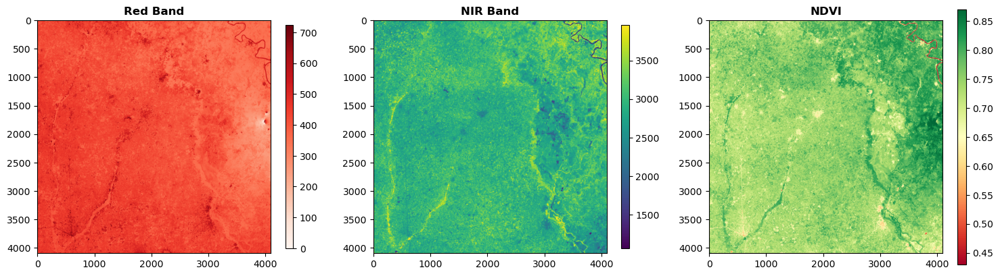

In [21]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.plot import show

# Open the image file
with rasterio.open(image_path) as src:
    # Read the red and NIR bands
    red = src.read(1)  # Red
    nir = src.read(4)  # NIR

# Calculate NDVI using raw values
ndvi = (nir - red) / (nir + red + 1e-10)

# Calculate the 99.9 percentile for each band/array
p999_red = np.percentile(red, 99.9)
p999_nir = np.percentile(nir, 99.9)
p999_ndvi = np.percentile(ndvi, 99.9)

# Create the figure with three panels
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
plt.subplots_adjust(wspace=0.3)

# Plot Red band (capping at 99.9 percentile)
im1 = show(
    red,
    ax=ax1,
    title="Red Band",
    cmap="Reds",
    vmax=p999_red,  # cap the upper limit
)
plt.colorbar(im1.get_images()[0], ax=ax1, shrink=0.7, aspect=30)

# Plot NIR band (capping at 99.9 percentile)
im2 = show(
    nir,
    ax=ax2,
    title="NIR Band",
    cmap="viridis",
    vmax=p999_nir,  # cap the upper limit
)
plt.colorbar(im2.get_images()[0], ax=ax2, shrink=0.7, aspect=30)

# Plot NDVI (capping at 99.9 percentile)
im3 = ax3.imshow(
    ndvi,
    cmap="RdYlGn",
    vmax=p999_ndvi,  # cap the upper limit
    vmin=np.percentile(ndvi, 0.1),  # optionally cap the lower limit, e.g., 0.1%
)
ax3.set_title("NDVI", fontweight="bold")
plt.colorbar(im3, ax=ax3, shrink=0.8, aspect=30)

plt.tight_layout(pad=1.0)
plt.show()


### Indice de végétation amélioré (EVI)

Facultatif, répétez le même processus pour l'indice de végétation amélioré (EVI). 

L'indice de végétation amélioré (EVI) est similaire à l'indice de végétation par différence normalisée (NDVI) et peut être utilisé pour quantifier la verdure de la végétation. Cependant, l'EVI corrige certaines conditions atmosphériques et le bruit de fond de la canopée et est plus sensible dans les zones à végétation dense. Il intègre une valeur « L » pour ajuster le fond de la canopée, des valeurs « C » comme coefficients pour la résistance atmosphérique et des valeurs de la bande bleue (B). Ces améliorations permettent de calculer l'indice sous forme de rapport entre les valeurs R et NIR, tout en réduisant le bruit de fond, le bruit atmosphérique et la saturation dans la plupart des cas. La formule de calcul de l'EVI est la suivante :

$$EVI = G \times \frac{NIR - Rouge}{NIR + C1 \times Rouge - C2 \times Bleu + L}$$

Où NIR est la bande proche infrarouge, Rouge est la bande rouge, Bleu est la bande bleue et G, C1, C2 et L sont des constantes. Les valeurs EVI résultantes vont de -1 à 1, les valeurs les plus élevées indiquant une végétation plus dense et plus saine. Les valeurs négatives représentent généralement de l'eau ou d'autres surfaces non végétalisées, tandis que les valeurs proches de zéro représentent des terres arides ou des zones urbaines.

In [22]:
############################
#### Optional Code here ####
############################


## Distribution des valeurs de pixels

Les ensembles de données d'images sont souvent trop volumineux pour être chargés en mémoire en une seule fois. Dans ce cas, il peut être utile de comprendre la distribution des valeurs de pixels dans l'ensemble de données avant de charger les images. Cela peut vous aider à identifier les valeurs aberrantes ou les anomalies dans les données et à décider comment normaliser les valeurs de pixels.

In [9]:
local_dir

'nicfi_data/basemaps'

In [10]:
clipped_images_dir = os.path.join(local_dir, mosaic)

shapes = []

directory = os.path.join(clipped_images_dir)
tif_files = glob.glob(os.path.join(directory, "*.tif"))

for tif_file in tqdm(tif_files, desc="Image chips", unit="file"):
    with rasterio.open(tif_file) as src:
        height = src.height
        width = src.width

        # Read only first 4 bands
        data = src.read(list(range(1, 5)))  # Bands 1-4

        stats = {}
        # Calculate statistics for each band
        for band_idx in range(4):  # Only process 4 bands
            band_data = data[band_idx]
            stats[f"band_{band_idx + 1}_min"] = float(np.min(band_data))
            stats[f"band_{band_idx + 1}_max"] = float(np.max(band_data))
            stats[f"band_{band_idx + 1}_mean"] = float(np.mean(band_data))
            stats[f"band_{band_idx + 1}_median"] = float(np.median(band_data))

    filename = os.path.splitext(os.path.basename(tif_file))[0]
    shapes.append({"filename": filename, "h": height, "w": width, **stats})

Image chips: 100%|██████████| 9/9 [00:05<00:00,  1.69file/s]


### Visualiser la distribution 

Dans ce graphique, nous examinons 4 histogrammes, un pour chaque statistique que nous avons calculée ci-dessus. Chaque histogramme comporte 4 couleurs représentant les 4 bandes de l'image. Les histogrammes montrent la distribution des valeurs de pixels pour chaque bande de l'image. L'axe des x représente les valeurs de pixels et l'axe des y représente le nombre de pixels avec cette plage de valeurs.

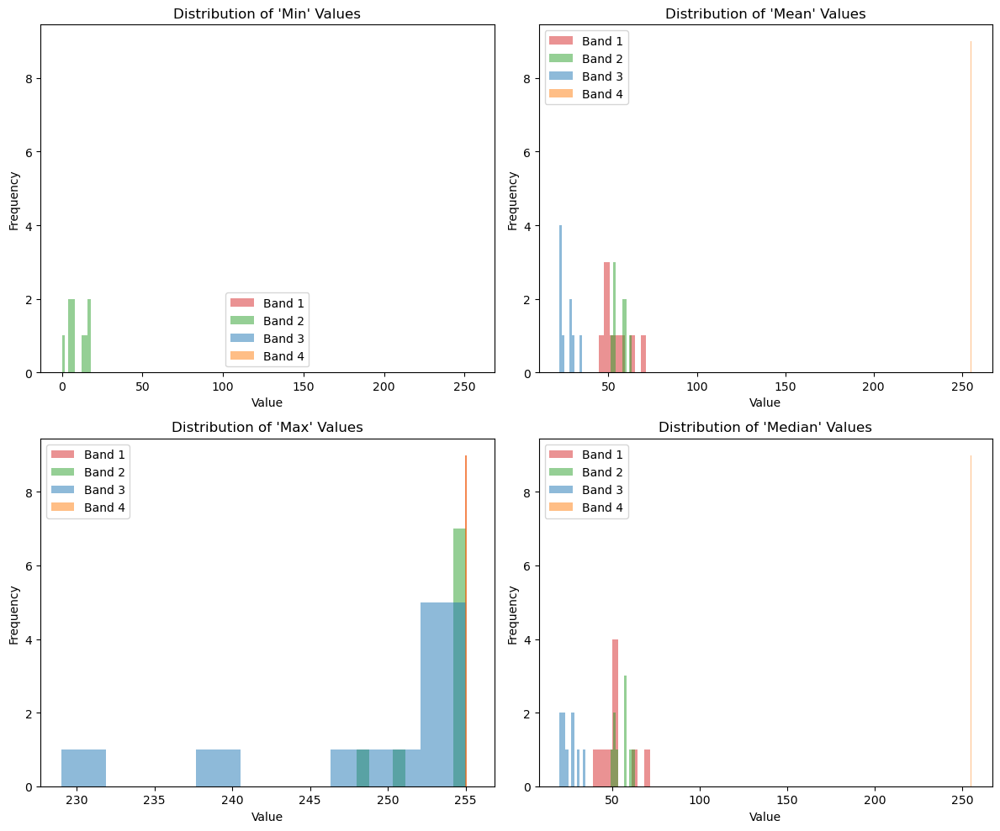

In [11]:
df = pd.DataFrame(shapes)

# Create 2x2 grid of histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()

stats_to_plot = [
    "min",
    "mean",
    "max",
    "median",
]
colors = [
    "#d62728",
    "#2ca02c",
    "#1f77b4",
    "#ff7f0e",
]  # Different color for each band

for idx, stat in enumerate(stats_to_plot):
    for band in range(4):
        column = f"band_{band + 1}_{stat}"
        axes[idx].hist(
            df[column], alpha=0.5, color=colors[band], label=f"Band {band + 1}", bins=9
        )

    axes[idx].set_title(f"Distribution of '{stat.capitalize()}' Values")
    axes[idx].set_xlabel("Value")
    axes[idx].set_ylabel("Frequency")
    axes[idx].legend()

plt.tight_layout()
plt.show()

## Redimensionnement de l'image

Dans cette section, nous allons redimensionner l'image à une taille standard. Il s'agit d'une étape de prétraitement courante pour les tâches de vision par ordinateur, car elle peut aider à améliorer les performances et la vitesse des modèles d'apprentissage automatique.

> MOSAIKS n'exige pas que toutes les images aient une taille standard. Si vous utilisez la bibliothèque torchgeo, les images seront redimensionnées à une taille standard, mais uniquement dans le but de tirer des pondérations empiriques des images. Les images d'origine peuvent être utilisées pour entraîner le modèle.

Dans ce cas, nous allons redimensionner l'image pour qu'elle corresponde à la taille moyenne de toutes les images de l'ensemble de données. Si vous souhaitez essayer d'utiliser des modèles prédéfinis, vous devrez redimensionner les images à la taille attendue par le modèle.

In [181]:
#### Code for resizing images ####